In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.colors import ListedColormap

from src.pipelines.data_pipeline import DataPipeline
from src.pipelines.model_pipeline import FirePredictionPipeline, save_pipeline, load_pipeline
from src.plotting.plotting import UkraineFirePlotting

## Introduction
 
This Jupyter notebook provides an example for classifying forest fires in Ukraine as potentially war-related or natural fires. The pipeline spans from data loading to model training, testing, and explainability.
 
**Key Steps:**
- Load and prepare training, calibration, and test data
- Train the fire prediction model pipeline
- Save, load, and test the trained model
- Obtain nearest neighbors and explanations for selected instances
- Plot and visualize results

### Step 1: Set Parameters for Training and Testing Periods

In [2]:
resolution = "50km"
start_date_train = pd.to_datetime('2015-01-01').date()
end_date_train = pd.to_datetime('2021-02-23').date()
start_date_calib = pd.to_datetime('2021-02-24').date()
end_date_calib = pd.to_datetime('2022-02-23').date()
start_date_test = pd.to_datetime('2022-02-24').date()
end_date_test = pd.to_datetime('2024-09-30').date()

### Step 2: Load Data Using DataPipeline

We load training, calibration, and test data using the DataPipeline object. Each subset of data represents a different period: historical fires for training, the lead-up to the war for calibration, and war-time fires for testing.

In [3]:
data_pipeline = DataPipeline(resolution=resolution)
X_train, y_train, _, fires_train = data_pipeline.fit_transform(start_date=start_date_train, end_date=end_date_train)
X_calib, y_calib, _, fires_calib = data_pipeline.transform(start_date=start_date_calib, end_date=end_date_calib)
X_test, y_test, ids_test, fires_test = data_pipeline.transform(start_date=start_date_test, end_date=end_date_test)

In [4]:
print("Data loaded successfully.")
print("X_train shape:", X_train.shape)
print("X_calib shape:", X_calib.shape)
print("X_test shape:", X_test.shape)

Data loaded successfully.
X_train shape: (828774, 16)
X_calib shape: (129940, 16)
X_test shape: (349600, 16)


### Step 3: Initialize and Fit the FirePredictionPipeline

Here we initialize the model pipeline and train it using the training and calibration data.

In [5]:
model_pipeline = FirePredictionPipeline()
print("Fitting the model pipeline...")
model_pipeline.fit(X_train, y_train, X_calib, y_calib)
print("Model pipeline fitted successfully.")

Fitting the model pipeline...
Model pipeline fitted successfully.


Let's have a look at the steps of the pipeline and the calibrated threshold.

In [6]:
model_pipeline.pipeline

Pipeline(steps=[('scaler', StandardScaler()),
                ('imputer', KNNImputer(n_neighbors=10)),
                ('pca', PCA(n_components=0.95, random_state=42)),
                ('regressor', RandomForestQuantileRegressor(random_state=42)),
                ('threshold',
                 ThresholdStep(threshold=np.float64(16.161161161161168))),
                ('decay',
                 RecalculateConfidenceScores(cutoff=10, decay_rate=1.0,
                                             midpoint=5))])

### Step 4: Save and Load the Model Pipeline

After training, we save the model pipeline and load it back for predictions.

In [7]:
save_pipeline(model_pipeline, "model_pipeline", resolution=resolution)
print("Model pipeline saved successfully.")
model_pipeline_loaded = load_pipeline("model_pipeline", resolution=resolution)
print("Model pipeline loaded successfully.")

Model saved in 20 parts, each <= 90 MB.
Model pipeline saved successfully.
Model pipeline loaded successfully.


### Step 5: Make Predictions on Test Data and Save Results

We use the loaded model pipeline to make predictions on the test data.

In [8]:
y_pred = model_pipeline_loaded.predict(X_test, y_test, ids_test)
print("Test predictions and scores calculated successfully.")
model_pipeline_loaded.save_predictions_to_csv(y_pred, fires_test, ids_test, f"results/{resolution}/test_predictions.csv")
print("Test prediction results saved successfully.")

Test predictions and scores calculated successfully.
Prediction results saved to results/50km/test_predictions.csv
Test prediction results saved successfully.


We print the some of the predicted results.

1. The predicted labels, i.e., `1` for potentially war-related fires and `0` for potentially normal fires.

In [9]:
unique, counts = np.unique(y_pred[0], return_counts=True)
print("Number of normal predictions:", counts[0])
print("Number of potentially war-related predictions:", counts[1])

Number of normal predictions: 336796
Number of potentially war-related predictions: 12804


2. The predicted significance scores, i.e., closer to `1` indicates potentially war-related fires and closer to `-1` indicates potentially normal fires. Values close to `0` indicate edge cases.

In [10]:
print("Mean of significance score for normal predictions:", y_pred[1][y_pred[0] == 0].mean())
print("Mean of significance score for potentially war-related predictions:", y_pred[1][y_pred[0] == 1].mean())

Mean of significance score for normal predictions: -0.994066826316738
Mean of significance score for potentially war-related predictions: 0.2736976577420848


### Step 6: Calculate and Save Nearest Neighbors

Here, we compute the nearest neighbors for a subset of test data and save the results.

In [11]:
onn_results = model_pipeline_loaded.get_onn(X_test.iloc[:10])
print("Nearest neighbors calculated successfully.")
model_pipeline_loaded.save_nn_results(onn_results, X_test, y_test, f"results/{resolution}/test")
print("Nearest neighbors results saved successfully.")

Nearest neighbors calculated successfully.
Nearest neighbors results saved successfully.


Let's have a look at an example pair of nearest neighbors.

In [12]:
idx = 0

# Create a DataFrame to hold the samples
data = {
    "Original Data": X_test.iloc[idx],
    "Nearest Neighbor with Fires": onn_results[0].iloc[idx],
    "Nearest Neighbor without Fires": onn_results[1].iloc[idx]
}

# Add fire counts to the DataFrame
fire_counts = {
    "Original Data": y_test.iloc[idx],
    "Nearest Neighbor with Fires": onn_results[2].iloc[idx],
    "Nearest Neighbor without Fires": onn_results[3].iloc[idx]
}

# Convert to DataFrame
df_samples = pd.DataFrame(data).transpose()
df_samples["FIRE_COUNT_CELL"] = fire_counts

# Print the DataFrame
print("Samples DataFrame:")
round(df_samples.transpose(), 2)

Samples DataFrame:


,Original Data,Nearest Neighbor with Fires,Nearest Neighbor without Fires
LATITUDE,46.50,46.50,46.50
LONGITUDE,33.00,33.00,33.00
DAY_OF_YEAR,55.00,82.00,51.00
LAND_USE_CLASS_0,0.02,0.02,0.02
LAND_USE_CLASS_1,0.14,0.14,0.14
LAND_USE_CLASS_2,0.31,0.31,0.31
LAND_USE_CLASS_3,0.49,0.49,0.49
LAND_USE_CLASS_4,0.04,0.04,0.04
POP_DENSITY,50.64,50.64,50.64
TEMPERATURE_2M_MAX (°C),10.10,6.30,8.30


### Step 7: Generate and Save Explanation for a Single Instance

We use the model to provide an explanation for a particular test instance and save the plot.

In [13]:
instance = X_test.iloc[idx]
exp = model_pipeline_loaded.get_explanation(instance.values)
model_pipeline_loaded.save_explanation_instance(exp, f"results/{resolution}/plots/explanation_{idx}")
print("Explanation instance generated successfully.")

Explanation instance generated successfully.


Let's have a look at the saved HTML explanation.

In [14]:
from IPython.display import display, HTML

# Load and display the saved HTML explanation file
html_file_path = f"results/{resolution}/plots/explanation_{idx}.html"
display(HTML(filename=html_file_path))

### Step 8: Explain the Test Data Subset

Finally, we generate explanations for a subset of test data and save them to a CSV file.

In [15]:
X_test_subset = X_test.iloc[:10].reset_index(drop=True)
explanations_df = model_pipeline_loaded.explain_data(X_test_subset, file_path=f"results/{resolution}/test_explanations.csv")
print("Explanations generated successfully.")

Explanations generated successfully.


### Step 9: Plot the Results

We visualize the results using various plots including fire data, population density, and land use.

1. Population density in Ukraine.
2. Land use in Ukraine.
3. 50km grid used in our pipeline.
4. Detected potentially war-related fires and significance scores for selected phases of the war in Ukraine

In [16]:
# Initialize the UkraineFirePlotting object
plotting = UkraineFirePlotting()

def plot_image(file_path, figsize=(15, 15)):
    img = mpimg.imread(file_path)
    plt.figure(figsize=figsize)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Saved land use in Ukraine 1km resolution


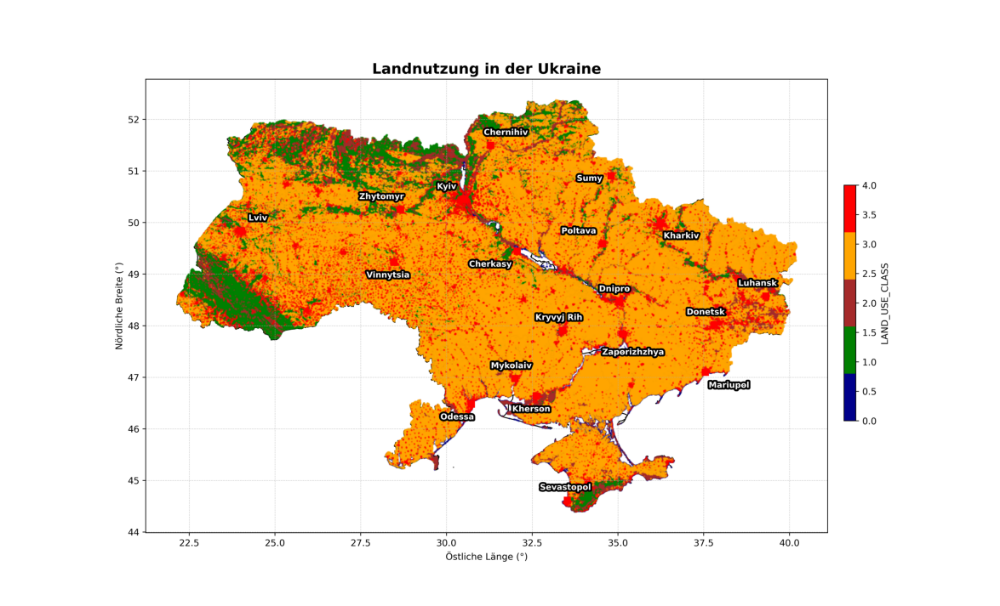

In [17]:
# Plot land use in Ukraine 1km resolution
land_use_data = pd.read_csv('data/ukr_land_use/ukr_land_use_2022_1km.csv')
land_use_class_mapping = {
    'LAND_USE_CLASS_0': 0,
    'LAND_USE_CLASS_1': 1,
    'LAND_USE_CLASS_2': 2,
    'LAND_USE_CLASS_3': 3,
    'LAND_USE_CLASS_4': 4
}

# Create a custom color map
custom_cmap = ListedColormap(['darkblue', 'green', 'brown', 'orange', 'red'])

# Apply the custom color map to the plotting function
land_use_data['LAND_USE_CLASS'] = land_use_data[['LAND_USE_CLASS_0', 'LAND_USE_CLASS_1', 'LAND_USE_CLASS_2', 
                                                    'LAND_USE_CLASS_3', 'LAND_USE_CLASS_4']].idxmax(axis=1).map(land_use_class_mapping)
file_path = plotting.plot_fire_data([land_use_data], event='Landnutzung in der Ukraine', cmaps=custom_cmap, alphas=[0.25], 
                        markersizes=[1], column='LAND_USE_CLASS', legend=True, plot_cities=True, city_color='red')
print("Saved land use in Ukraine 1km resolution")

# Load and display the saved plot
plot_image(file_path, (15, 9))

Saved population density in Ukraine


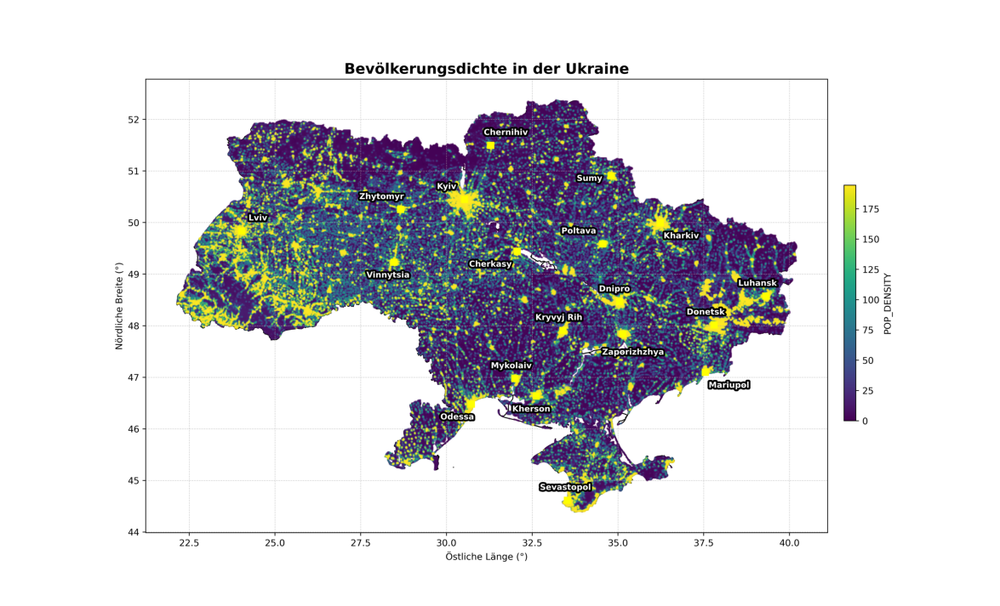

In [21]:
# Plot population density
population_data = pd.read_csv('data/ukr_pop_density/ukr_pop_density_2020_1km.csv')
# Assign all rows with a value greater than 250 to 250
population_data['POP_DENSITY'] = population_data['POP_DENSITY'].apply(lambda x: 250 if x > 250 else x)
file_path = plotting.plot_fire_data([population_data], event='Bevölkerungsdichte in der Ukraine', cmaps='viridis', alphas=[0.25], 
                        markersizes=[1], column='POP_DENSITY', legend=True, plot_cities=True, city_color='yellow')     
print("Saved population density in Ukraine")

# Load and display the saved plot
plot_image(file_path, (15, 9))

Saved land use in Ukraine 50km resolution


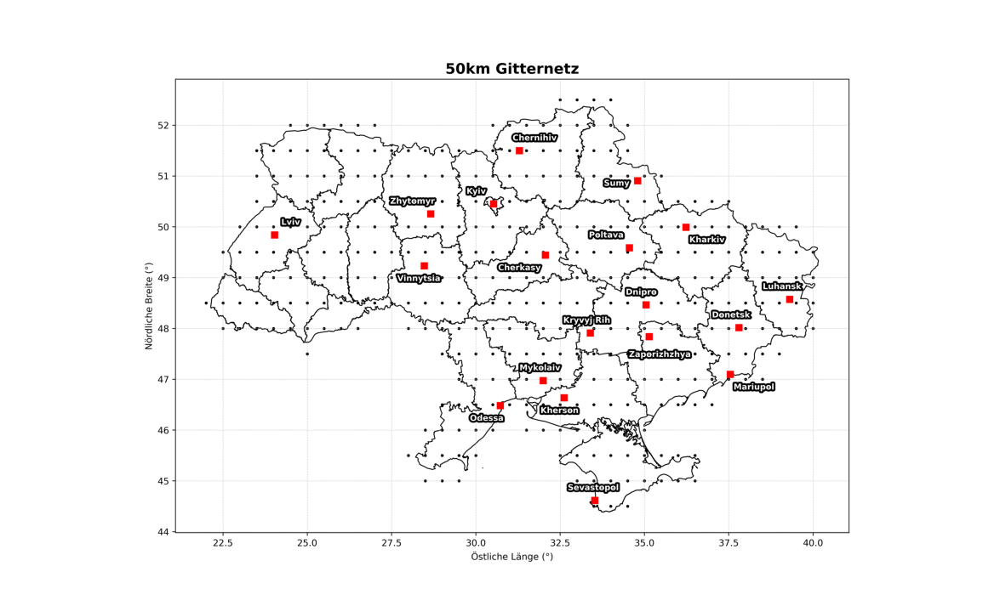

In [18]:
# Plot land use in Ukraine 50km resolution
land_use_data = pd.read_csv('data/ukr_land_use/ukr_land_use_2022_50km.csv')
land_use_data['LAND_USE_CLASS'] = land_use_data[['LAND_USE_CLASS_0', 'LAND_USE_CLASS_1', 'LAND_USE_CLASS_2', 
                                                    'LAND_USE_CLASS_3', 'LAND_USE_CLASS_4']].idxmax(axis=1).map(land_use_class_mapping)
file_path = plotting.plot_fire_data([land_use_data], event='50km Gitternetz', colors=['black'], alphas=[1], 
                        markersizes=[5], column='LAND_USE_CLASS', legend=True, plot_cities=True, city_color='red')
print("Saved land use in Ukraine 50km resolution")

# Load and display the saved plot
plot_image(file_path, (15, 9))

In [19]:
# Load data for plotting
predictions = pd.read_csv('results/50km/test_predictions.csv')
abnormal_fires = predictions[predictions['ABNORMAL_LABEL_DECAY'] == True]
normal_fires = predictions[predictions['ABNORMAL_LABEL_DECAY'] == False]

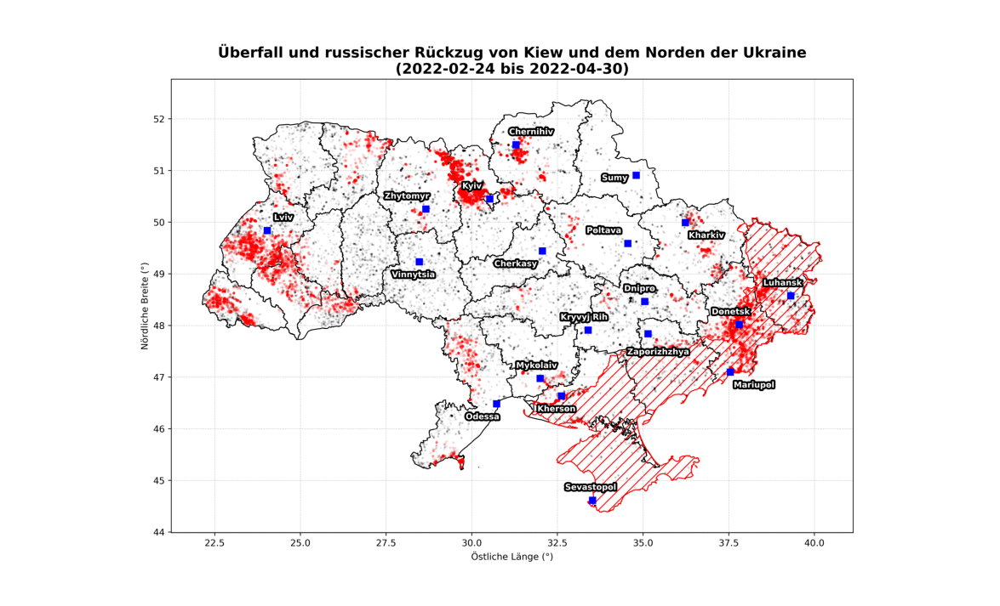

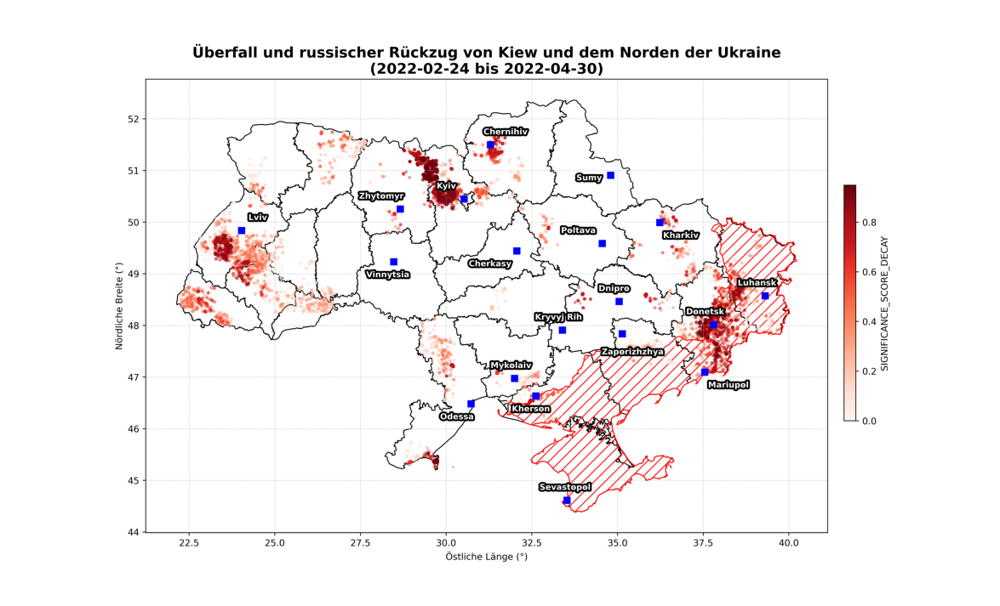

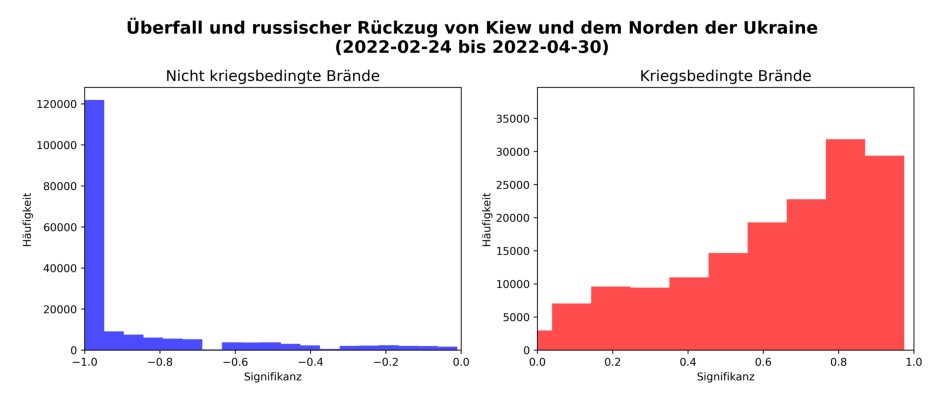

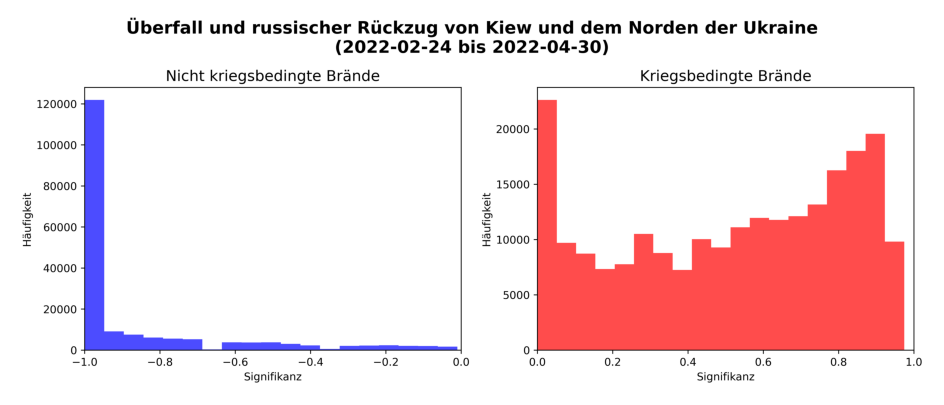

Saved data for event: Überfall und russischer Rückzug von Kiew und dem Norden der Ukraine (2022-02-24 - 2022-04-30)


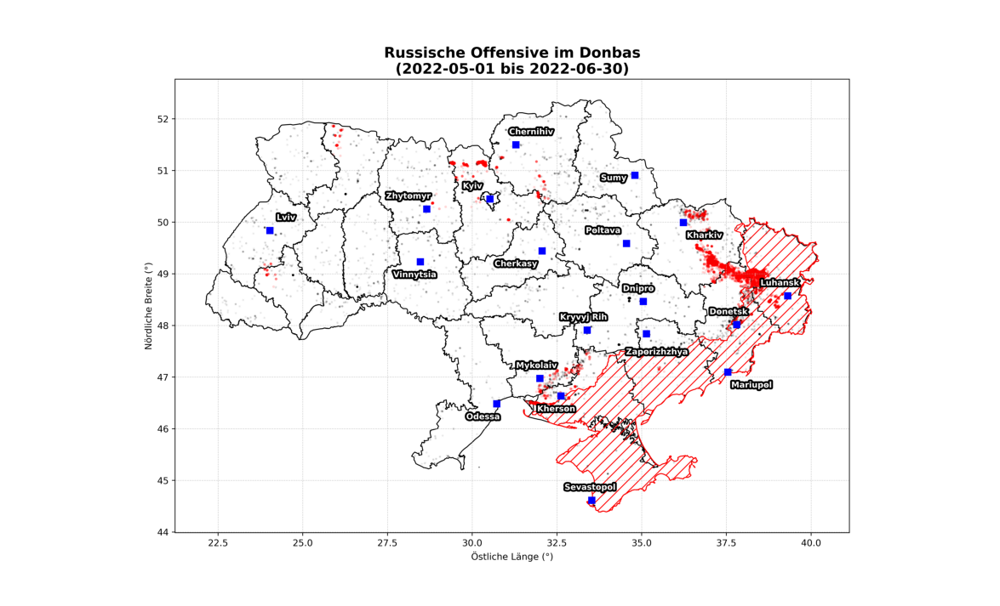

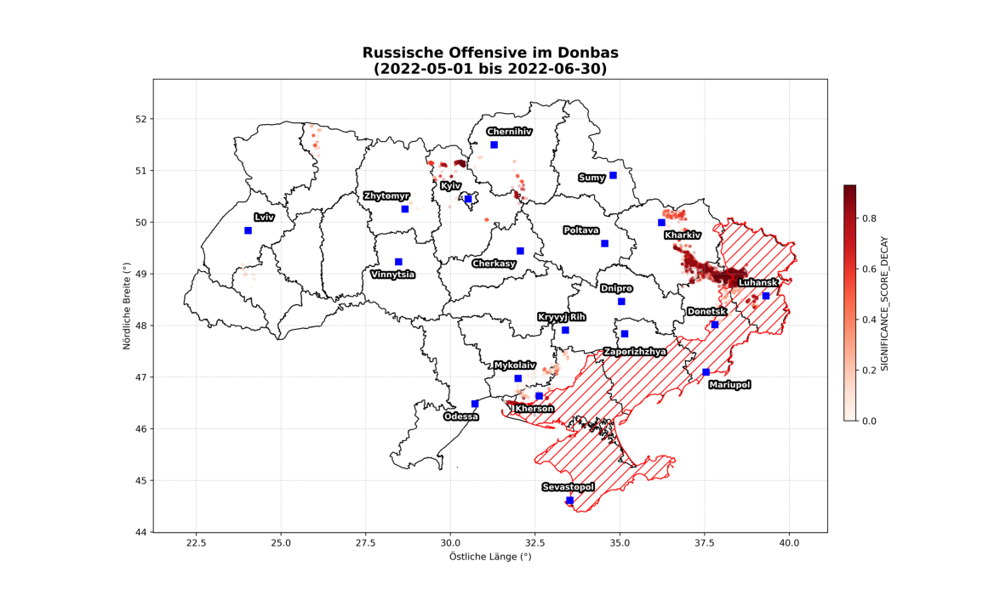

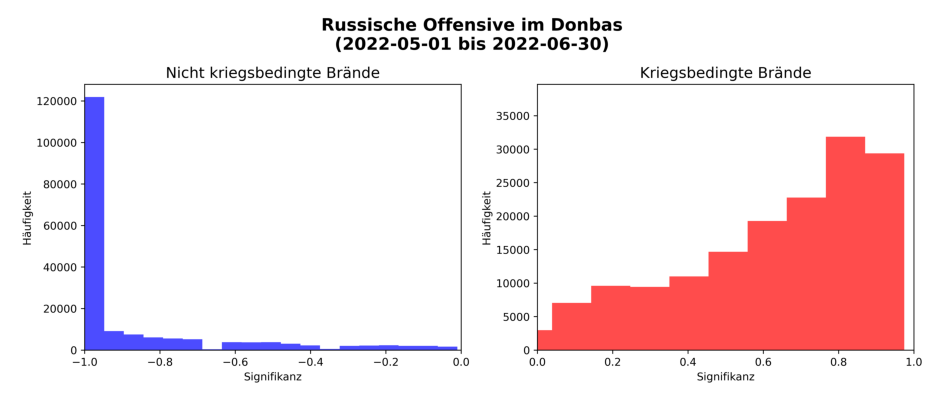

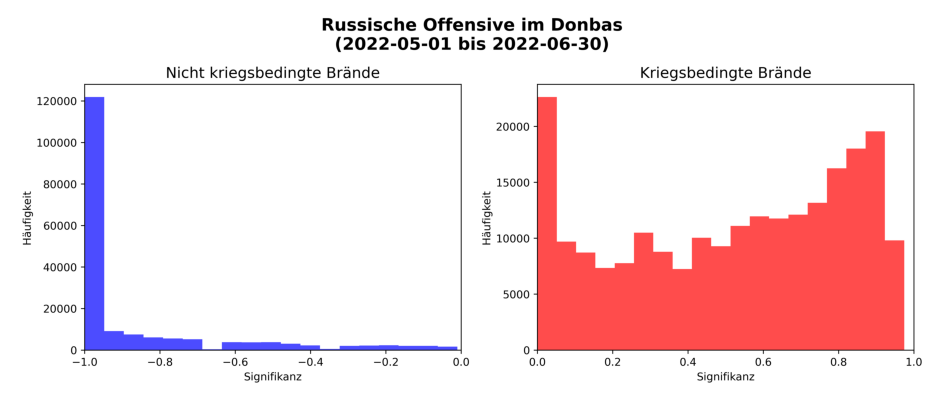

Saved data for event: Russische Offensive im Donbas (2022-05-01 - 2022-06-30)


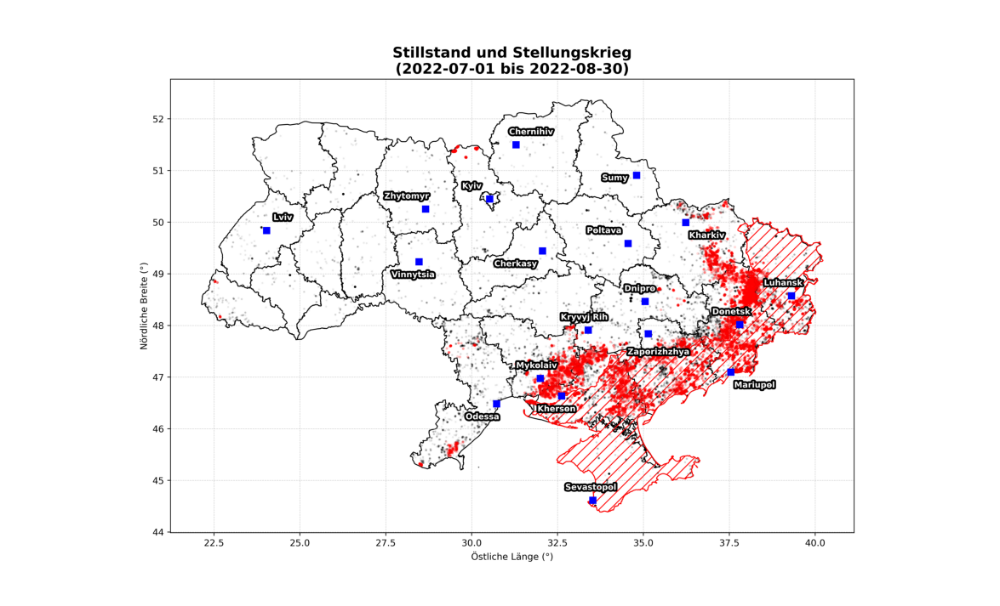

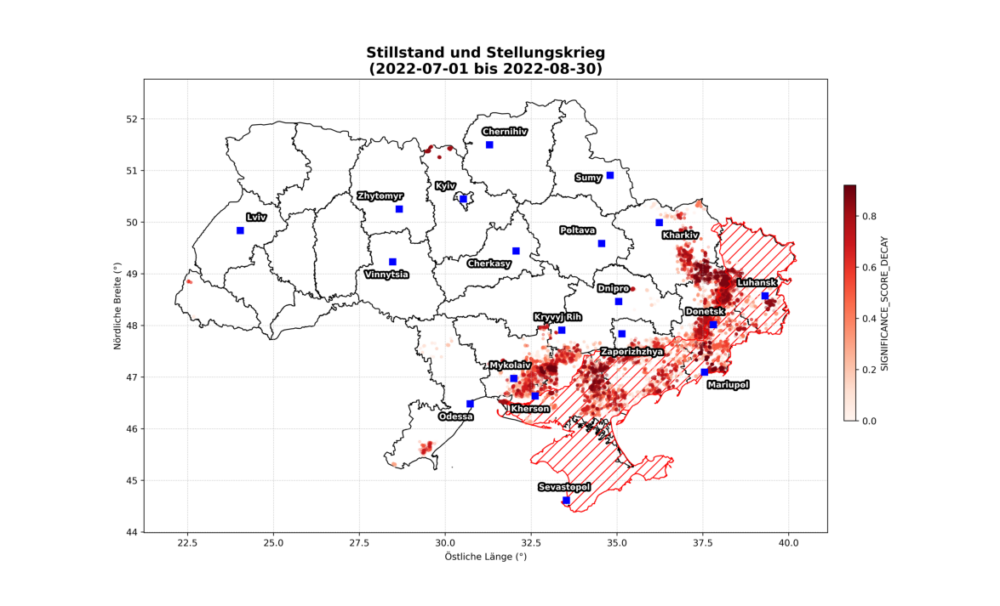

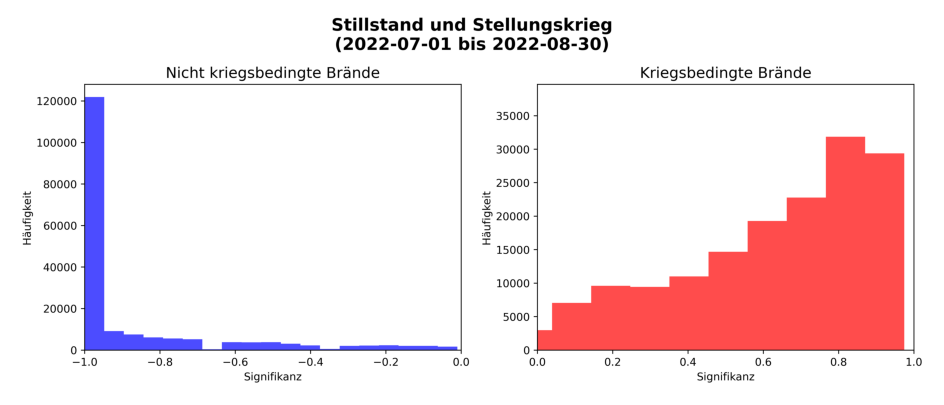

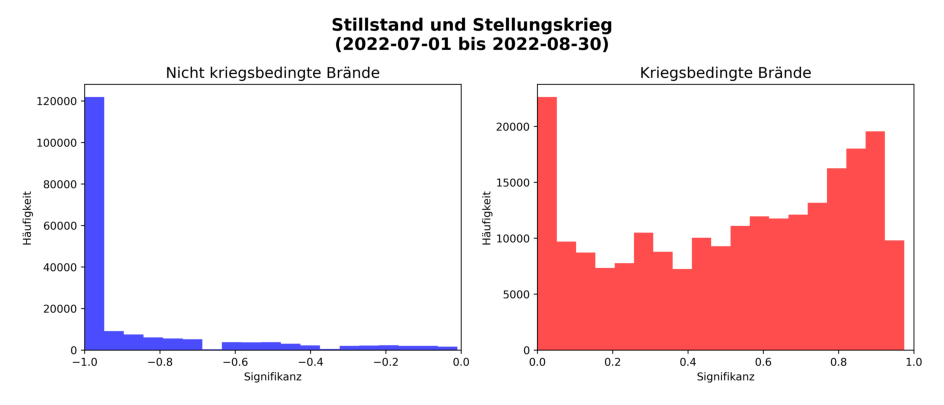

Saved data for event: Stillstand und Stellungskrieg (2022-07-01 - 2022-08-30)


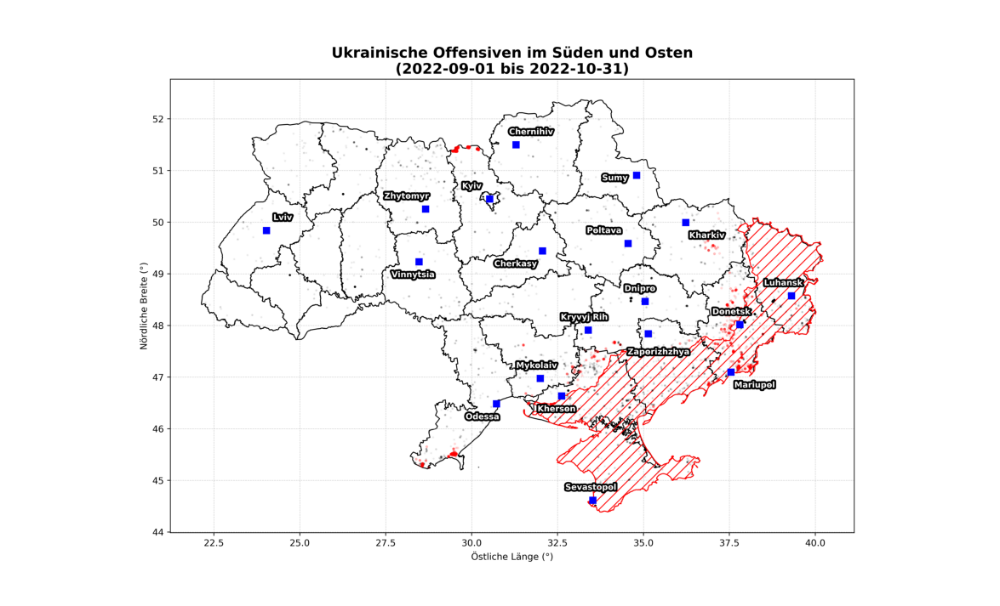

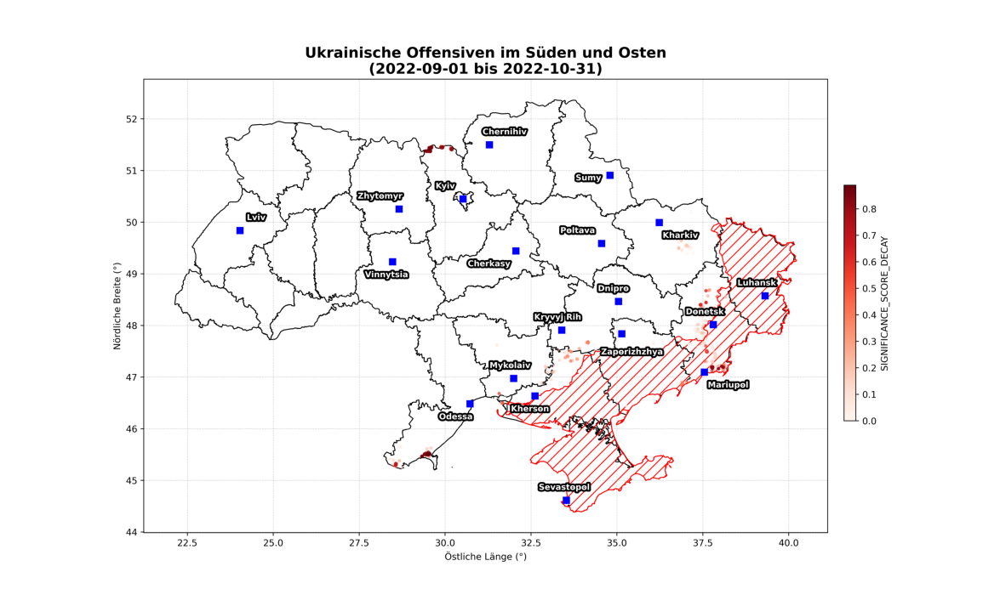

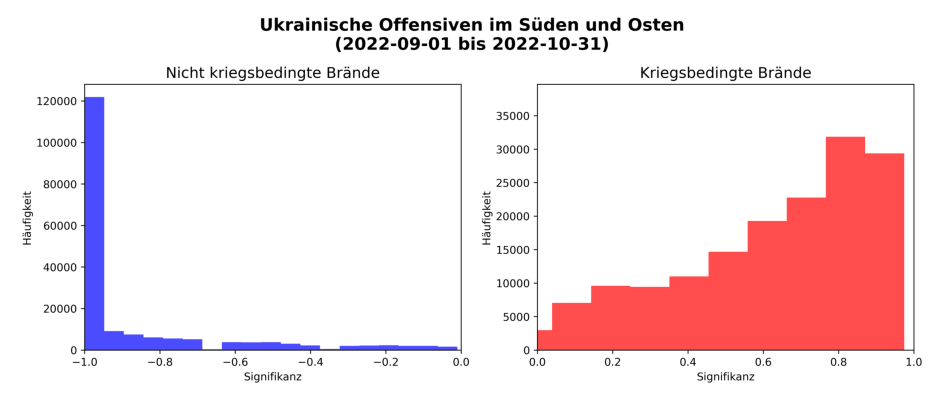

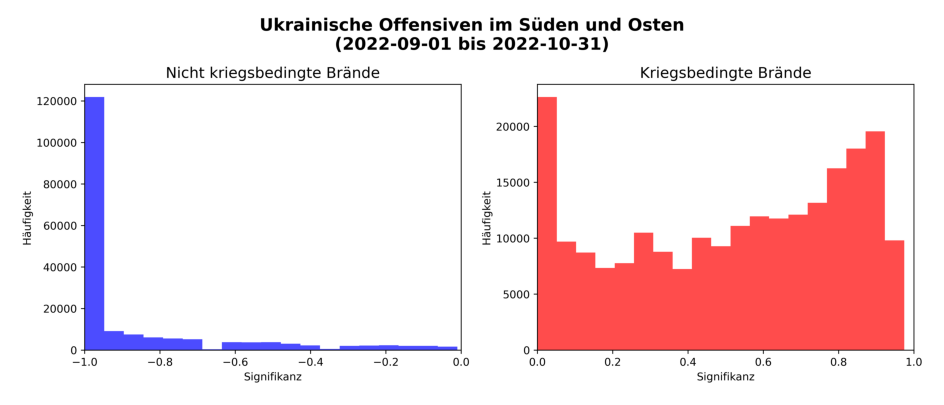

Saved data for event: Ukrainische Offensiven im Süden und Osten (2022-09-01 - 2022-10-31)


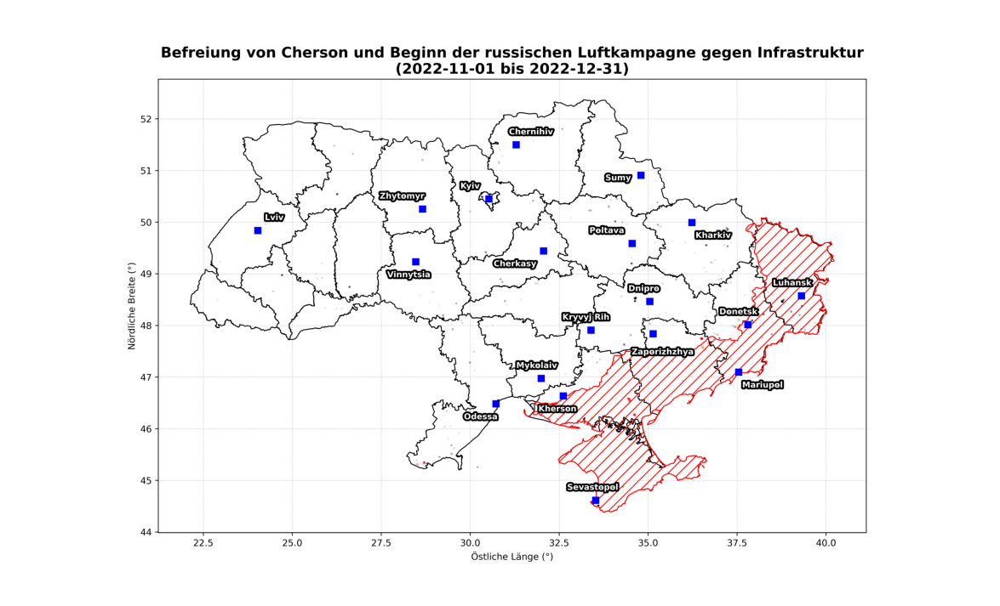

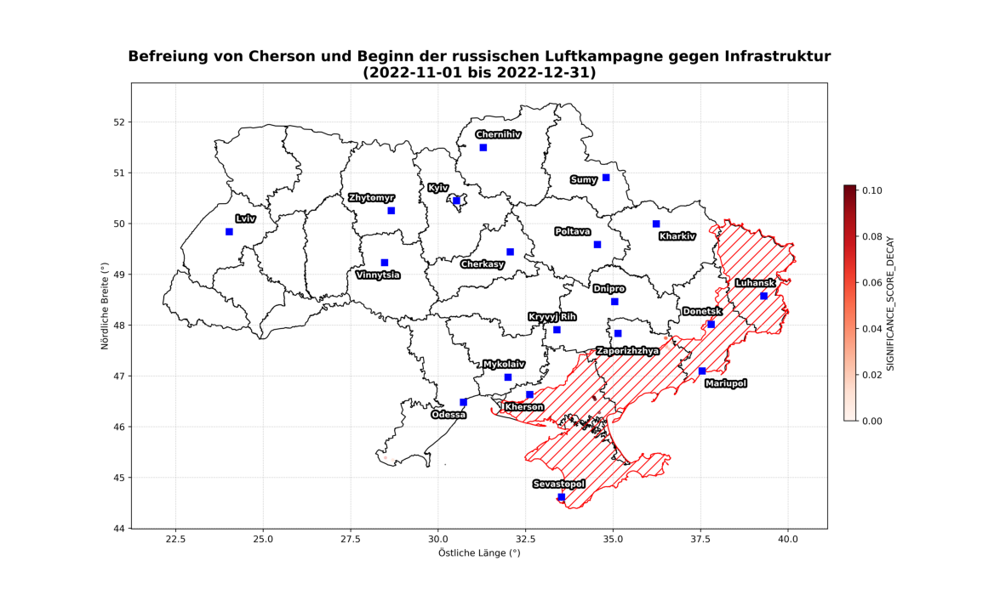

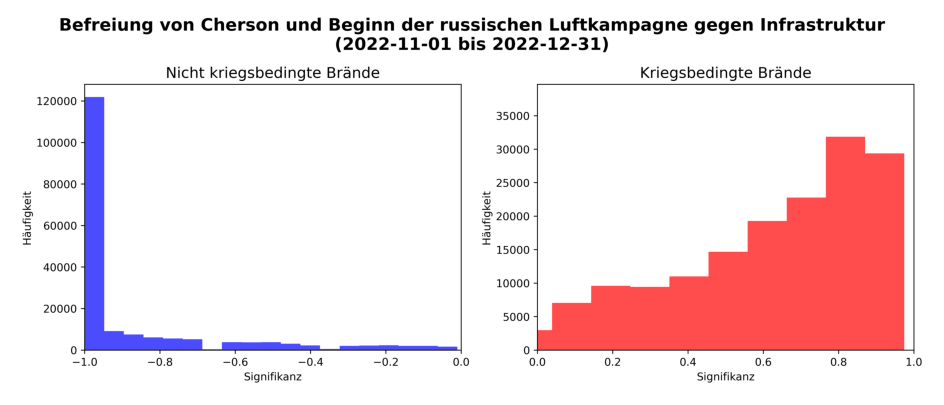

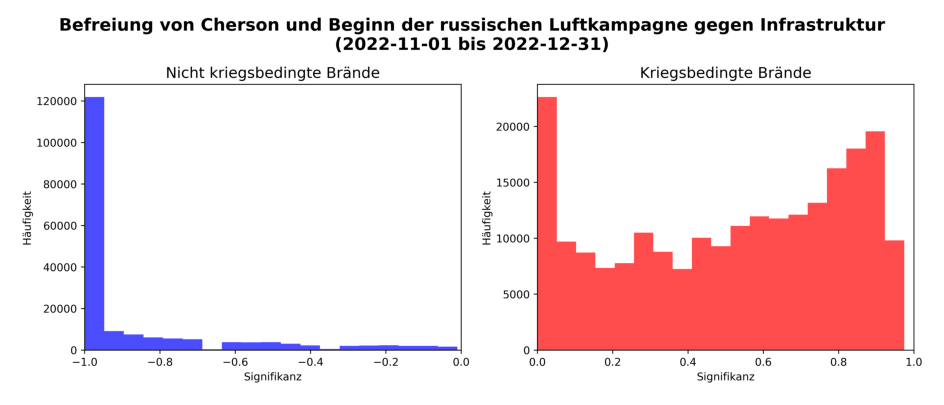

Saved data for event: Befreiung von Cherson und Beginn der russischen Luftkampagne gegen Infrastruktur (2022-11-01 - 2022-12-31)


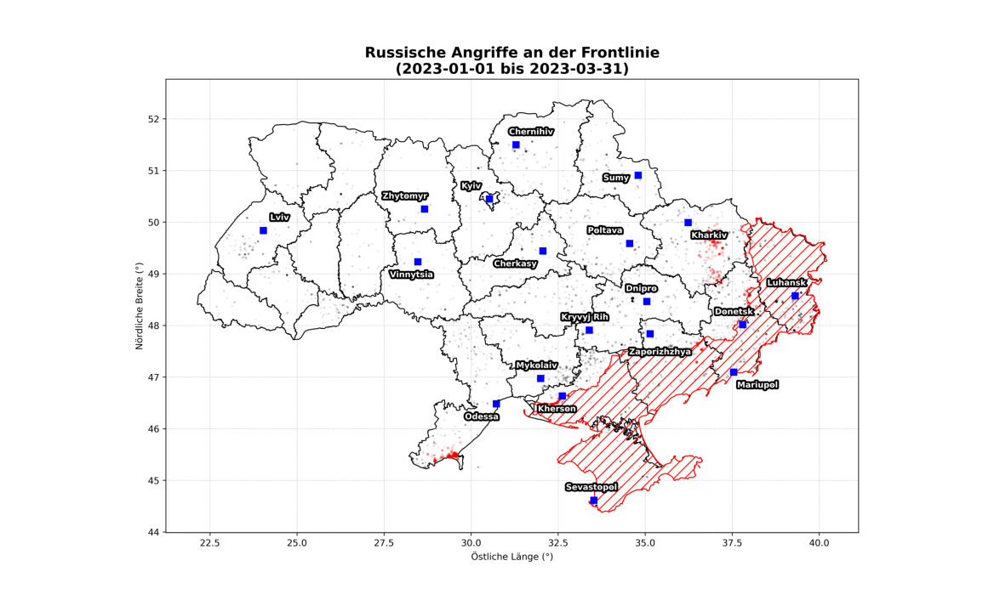

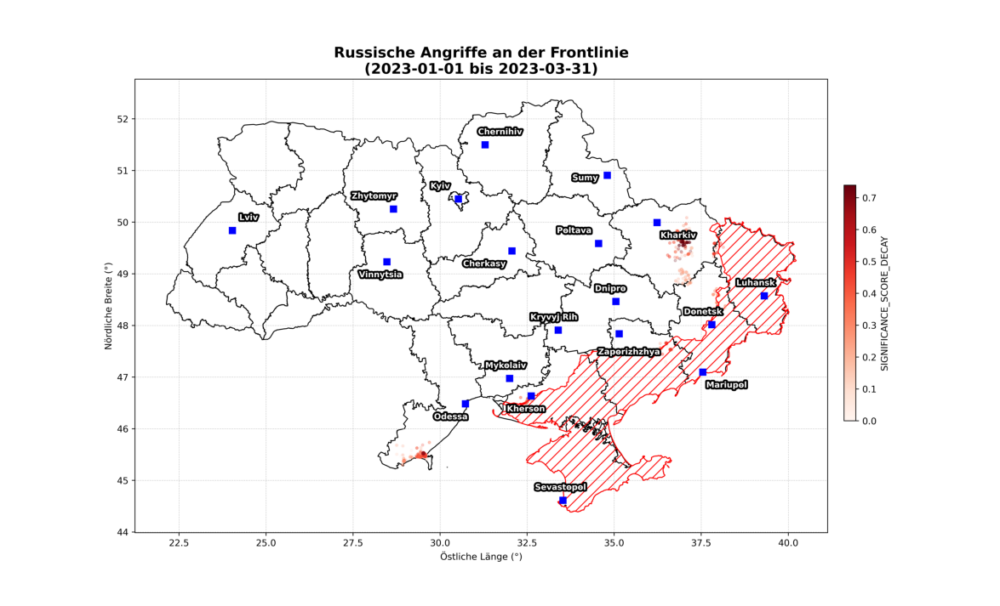

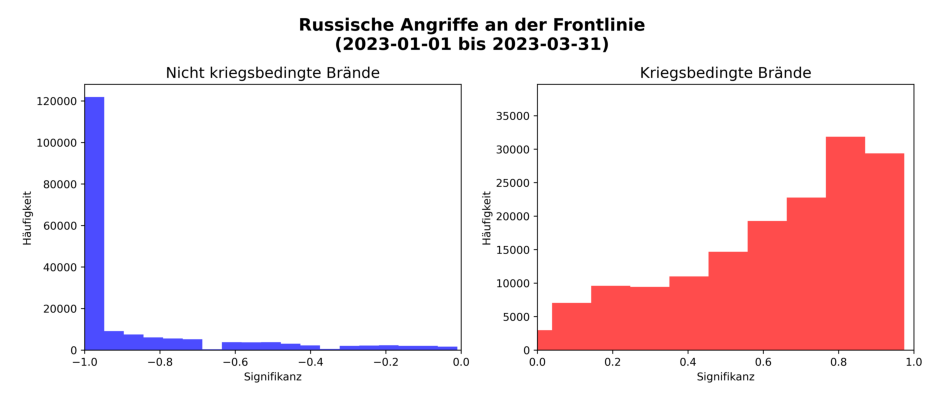

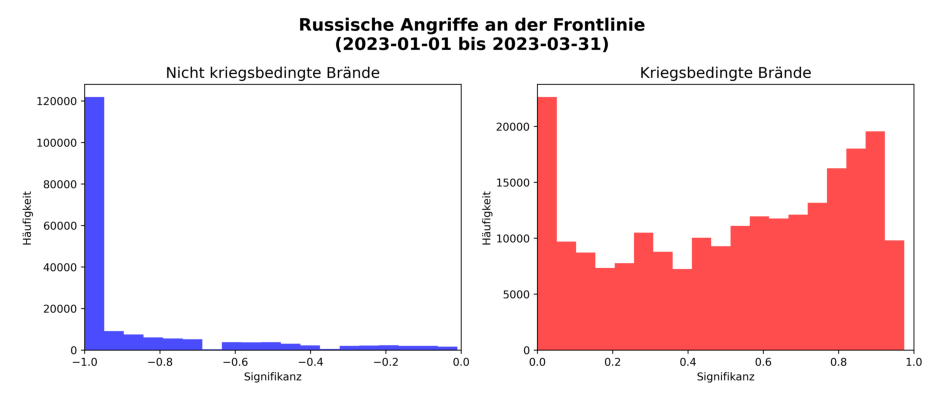

Saved data for event: Russische Angriffe an der Frontlinie (2023-01-01 - 2023-03-31)


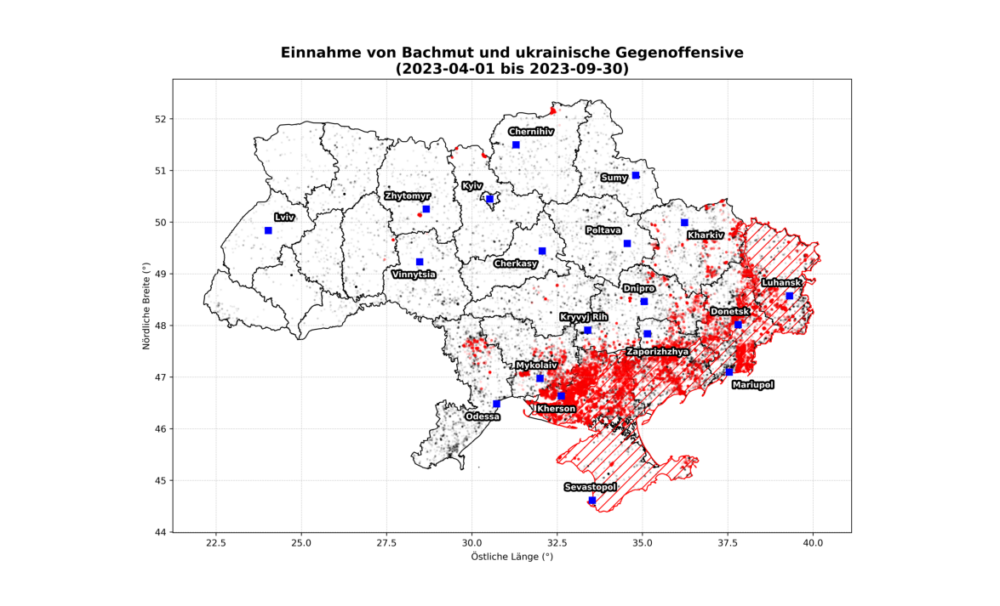

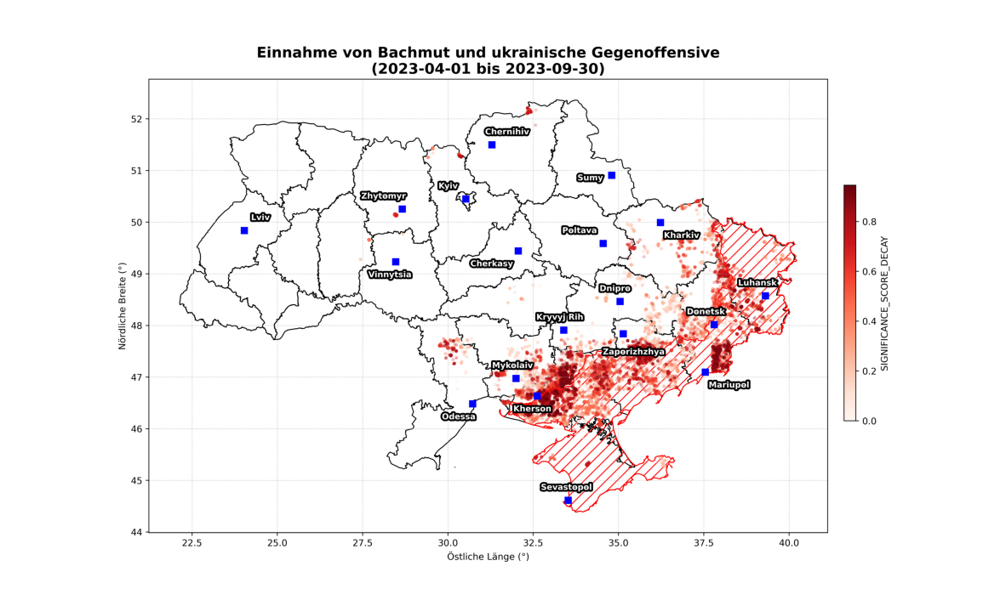

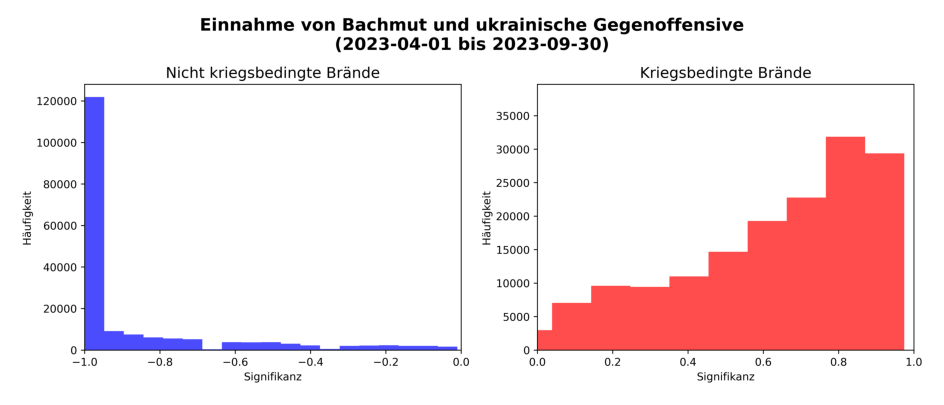

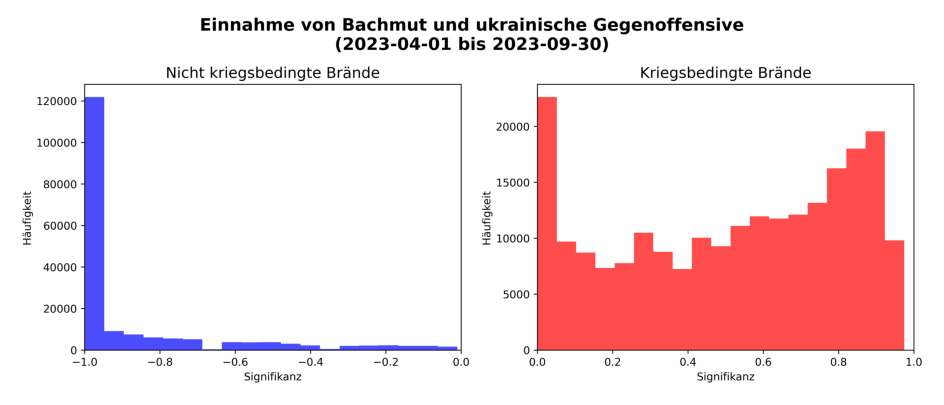

Saved data for event: Einnahme von Bachmut und ukrainische Gegenoffensive (2023-04-01 - 2023-09-30)


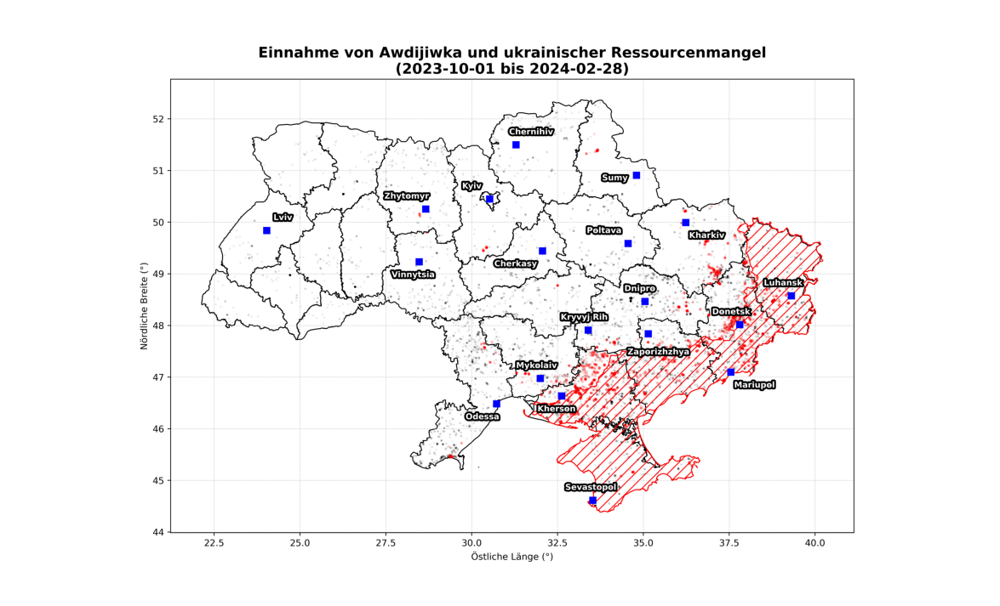

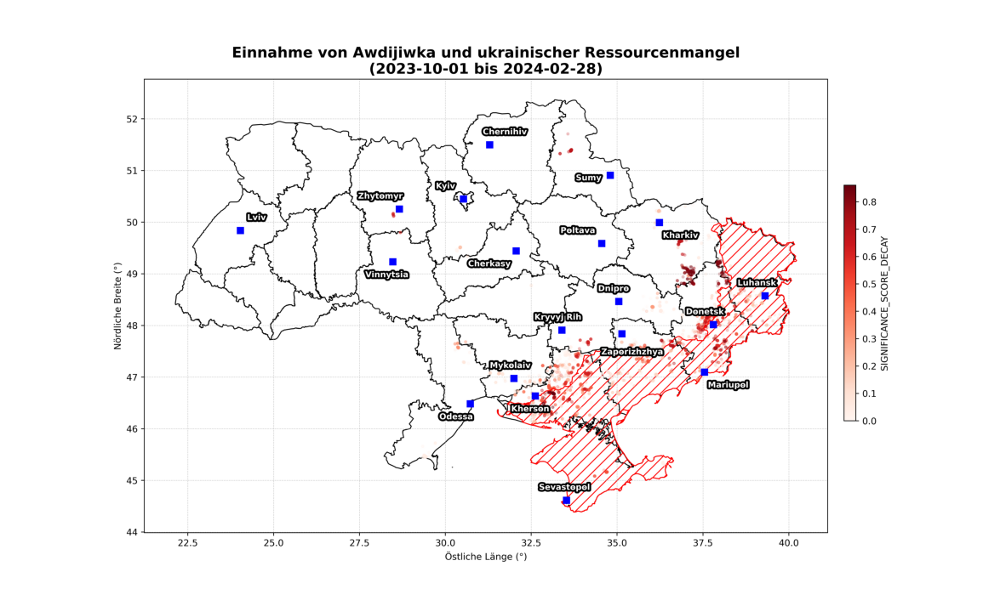

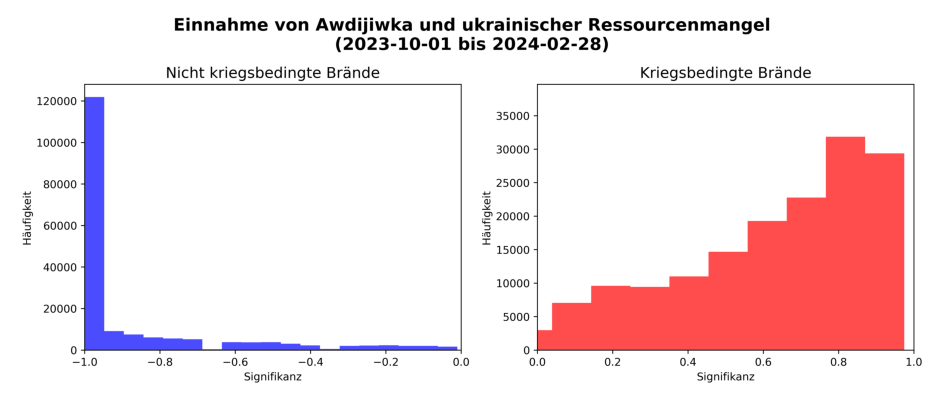

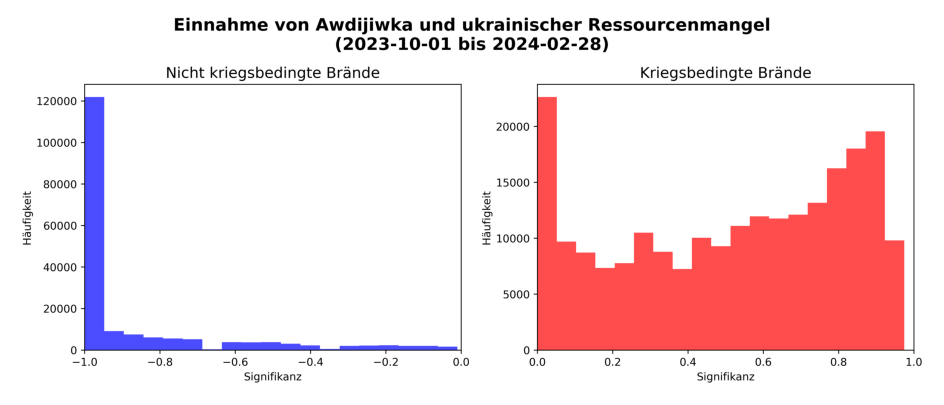

Saved data for event: Einnahme von Awdijiwka und ukrainischer Ressourcenmangel (2023-10-01 - 2024-02-28)


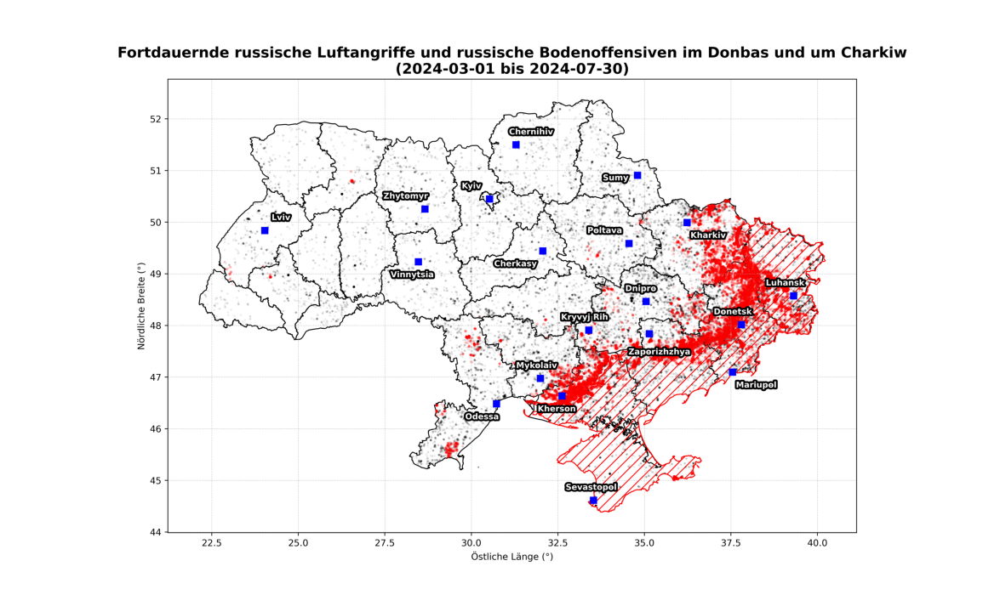

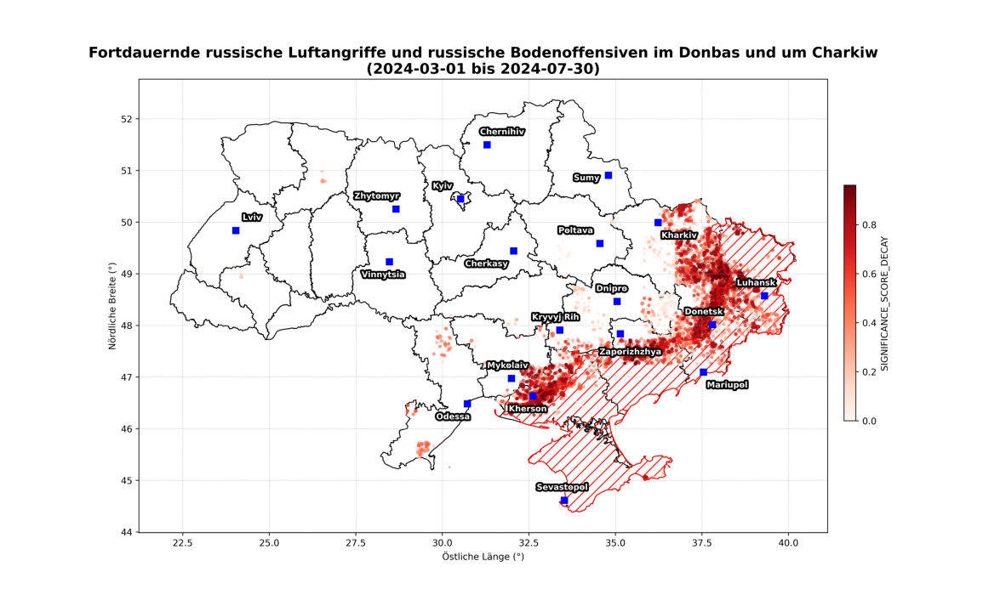

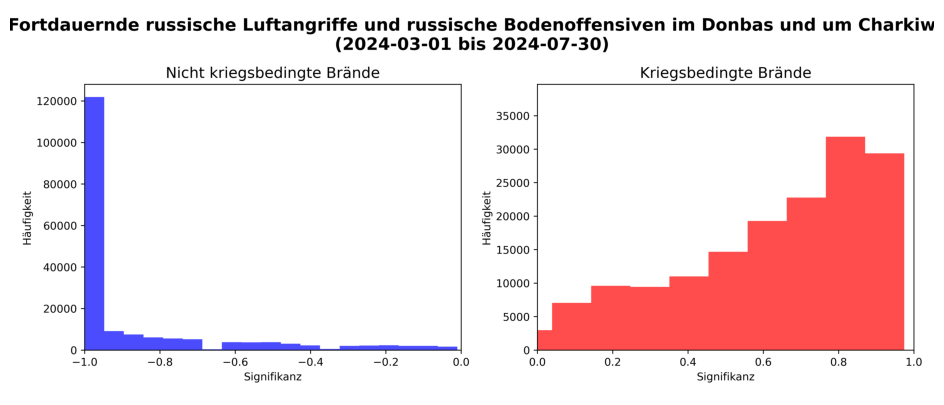

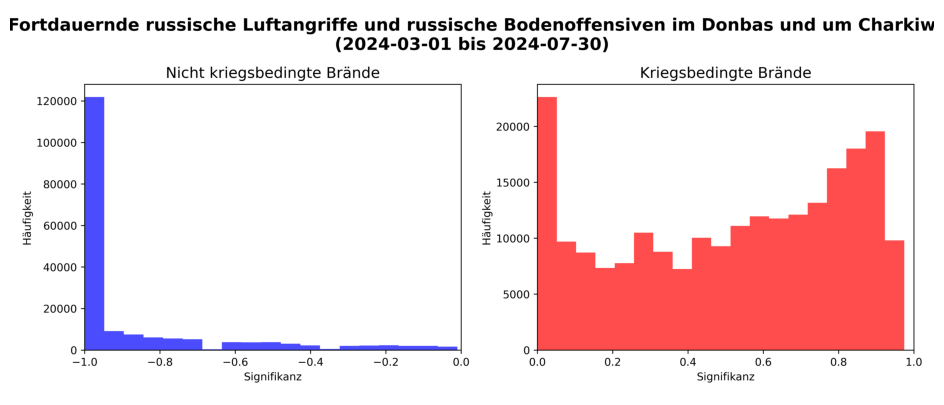

Saved data for event: Fortdauernde russische Luftangriffe und russische Bodenoffensiven im Donbas und um Charkiw (2024-03-01 - 2024-07-30)


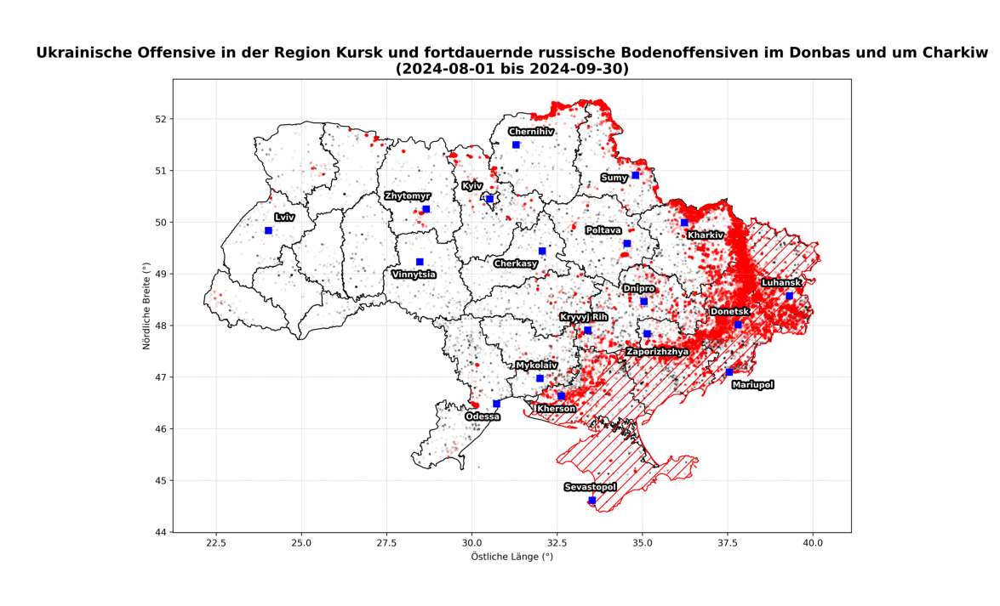

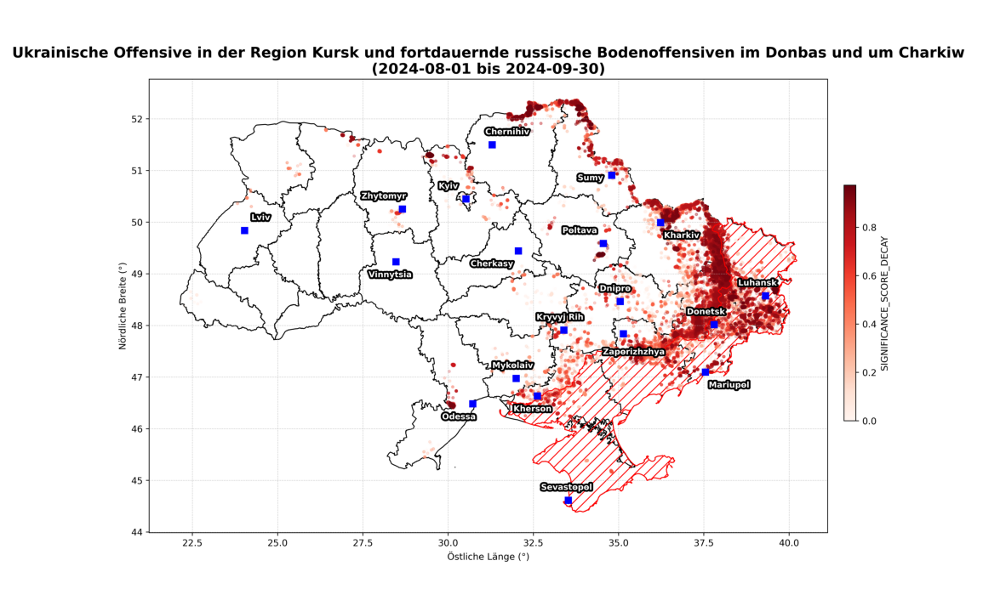

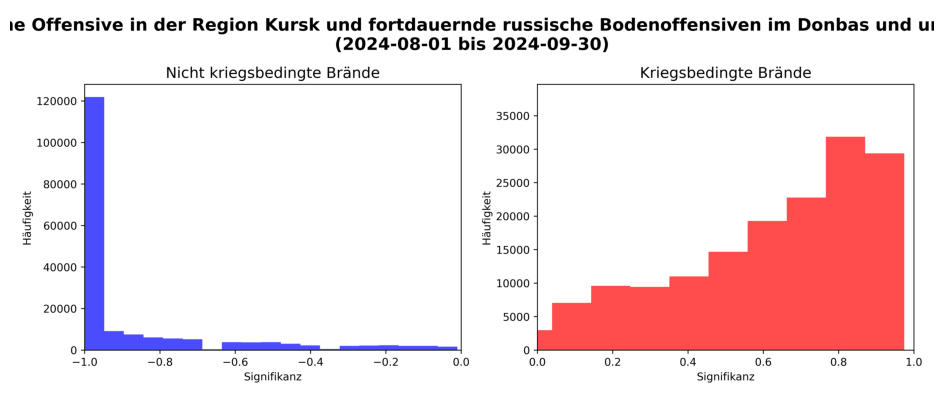

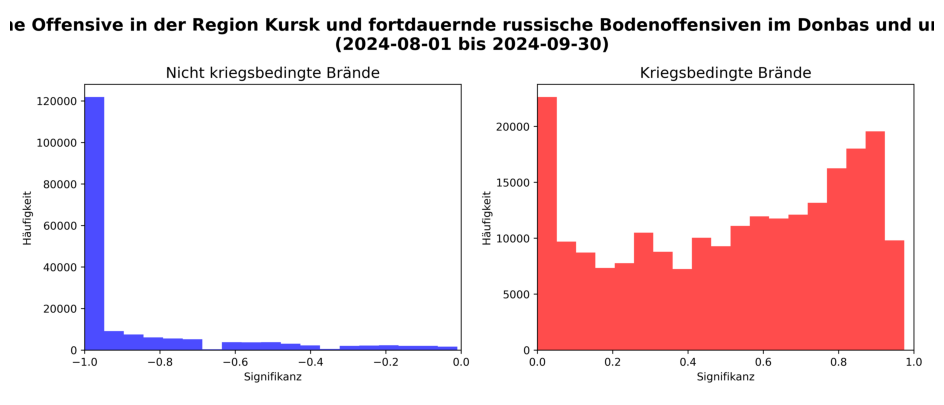

Saved data for event: Ukrainische Offensive in der Region Kursk und fortdauernde russische Bodenoffensiven im Donbas und um Charkiw (2024-08-01 - 2024-09-30)


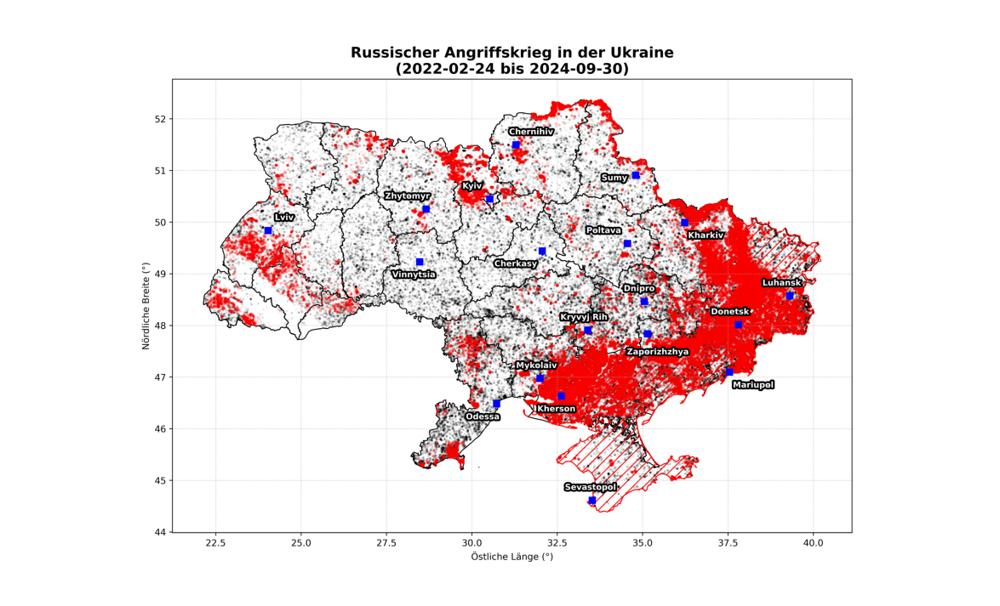

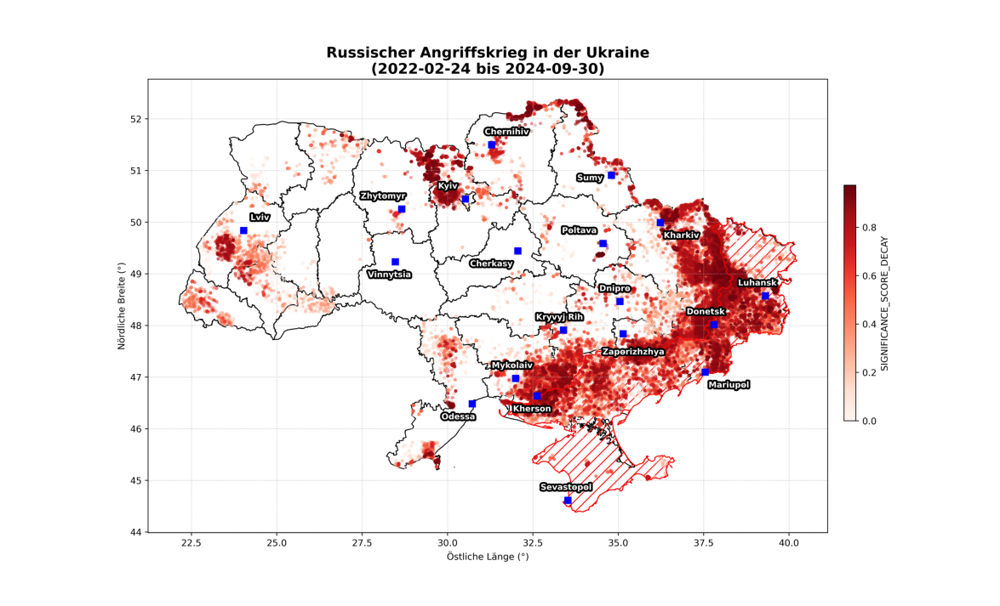

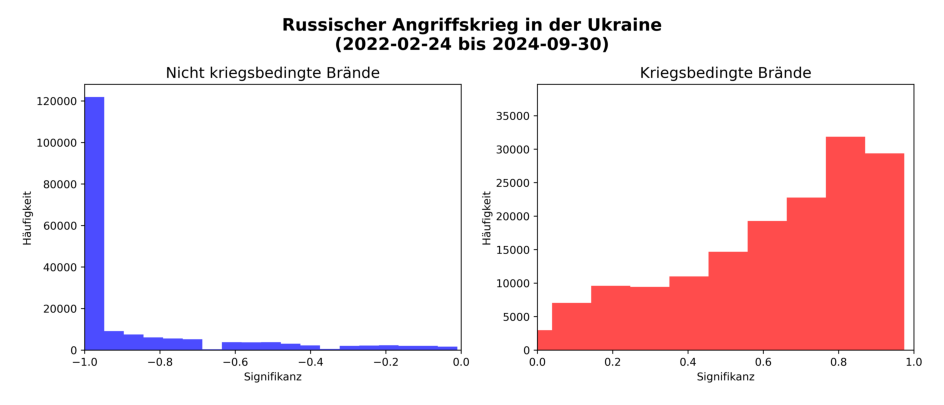

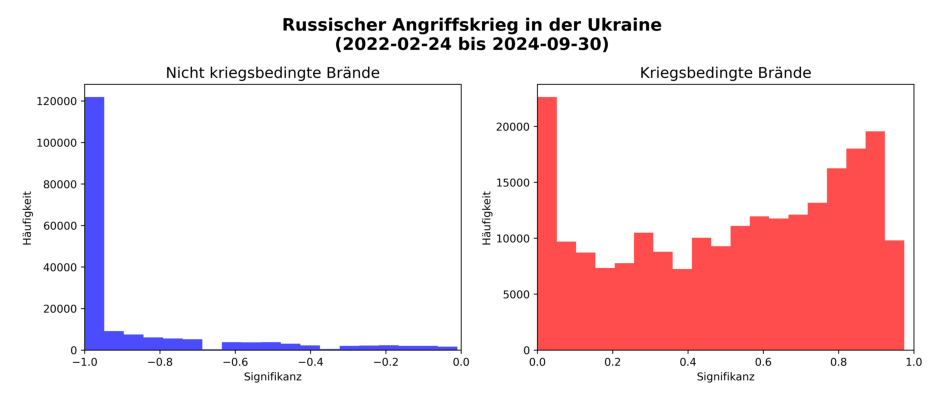

Saved data for event: Russischer Angriffskrieg in der Ukraine (2022-02-24 - 2024-09-30)


In [20]:
# Plotting example using war events
for _, row in plotting.war_events.iterrows():
    start_date, end_date, event = pd.to_datetime(row['START_DATE']).date(), pd.to_datetime(row['END_DATE']).date(), row['EVENT']
    # Plot abnormal and normal fires
    file_path = plotting.plot_fire_data([normal_fires, abnormal_fires], event=event, start_date=start_date, end_date=end_date,
                                        colors=['black', 'red'], alphas=[0.05, 0.1], markersizes=[2, 4],
                                        plot_cities=True, city_color='blue', plot_rus_adv=True)
    plot_image(file_path, (15, 9))
    file_path = plotting.plot_fire_data([abnormal_fires], event=event, start_date=start_date, end_date=end_date,
                                        cmaps='Reds', alphas=[0.2], markersizes=[7], column='SIGNIFICANCE_SCORE_DECAY',
                                        plot_cities=True, city_color='blue', legend=True, plot_rus_adv=True)
    plot_image(file_path, (15, 9))
    # Plot significance score histogram
    file_path = plotting.plot_histogram(normal_fires, abnormal_fires, start_date, end_date, event, column='SIGNIFICANCE_SCORE')
    plot_image(file_path, (12, 5))
    file_path = plotting.plot_histogram(normal_fires, abnormal_fires, start_date, end_date, event, column='SIGNIFICANCE_SCORE_DECAY')
    plot_image(file_path, (12, 5))
    print(f"Saved data for event: {event} ({start_date} - {end_date})")